In [1]:
rm(list = ls())

library(LalRUtils)
libreq(data.table, magrittr, tidyverse, janitor, huxtable, knitr, patchwork, timeDate, plotly)
# theme_set(lal_plot_theme(textangle = 90))
theme_set(lal_plot_theme(textangle = 90))
set.seed(42)
options(repr.plot.width = 15, repr.plot.height=12)

      wants        loaded
 [1,] "data.table" TRUE  
 [2,] "magrittr"   TRUE  
 [3,] "tidyverse"  TRUE  
 [4,] "janitor"    TRUE  
 [5,] "huxtable"   TRUE  
 [6,] "knitr"      TRUE  
 [7,] "patchwork"  TRUE  
 [8,] "timeDate"   TRUE  
 [9,] "plotly"     TRUE  


# Mobility Reports Query
[info](https://console.cloud.google.com/marketplace/details/bigquery-public-datasets/covid19_google_mobility?filter=solution-type%3Adataset&id=db650d71-e53e-4677-b37b-d8bdca3ec4dc&project=spatial-acumen-244921&folder&organizationId)

In [2]:
libreq(tidyverse, DBI, dbplyr, RSQLite, bigrquery, tictoc)

     wants       loaded
[1,] "tidyverse" TRUE  
[2,] "DBI"       TRUE  
[3,] "dbplyr"    TRUE  
[4,] "RSQLite"   TRUE  
[5,] "bigrquery" TRUE  
[6,] "tictoc"    TRUE  


In [3]:
projid <- Sys.getenv("GCE_DEFAULT_PROJECT_ID")
bq_auth(email = "lal.apoorva@gmail.com",
       path = "~/keys/sandbox.json")

In [4]:
bq_con <-  dbConnect(
    bigrquery::bigquery(),
    project = "bigquery-public-data",
    dataset = "covid19_google_mobility",
    billing = projid
    )
bq_con
dbListTables(bq_con)

<BigQueryConnection>
  Dataset: bigquery-public-data.covid19_google_mobility
  Billing: spatial-acumen-244921

[1] "mobility_report"

In [5]:
mob <- tbl(bq_con, "mobility_report")
mob %>% glimpse

Rows: ??
Columns: 14
Database: BigQueryConnection
$ country_region_code                                <chr> "AE", "AE", "AE", …
$ country_region                                     <chr> "United Arab Emira…
$ sub_region_1                                       <chr> "Abu Dhabi", "Abu …
$ sub_region_2                                       <chr> NA, NA, NA, NA, NA…
$ metro_area                                         <chr> NA, NA, NA, NA, NA…
$ iso_3166_2_code                                    <chr> "AE-AZ", "AE-AZ", …
$ census_fips_code                                   <chr> NA, NA, NA, NA, NA…
$ date                                               <date> 2020-02-15, 2020-…
$ retail_and_recreation_percent_change_from_baseline <int> 1, -2, -3, -3, -3,…
$ grocery_and_pharmacy_percent_change_from_baseline  <int> 6, 5, 2, 2, 1, 2, …
$ parks_percent_change_from_baseline                 <int> -2, 2, 4, 1, 0, 3,…
$ transit_stations_percent_change_from_baseline      <int> -1, -2, -3, -2, -1…
$ 

In [6]:
mob %>% filter(country_region_code == "US") %>% 
    collect() -> us_mobility

In [7]:
tic()
mob %>% collect() ->
    mobility_df
toc()

291.256 sec elapsed


In [8]:
mobility_df %<>% setDT
mobility_df %>% glimpse()

Rows: 3,255,060
Columns: 14
$ country_region_code                                <chr> "AE", "AE", "AE", …
$ country_region                                     <chr> "United Arab Emira…
$ sub_region_1                                       <chr> "Abu Dhabi", "Abu …
$ sub_region_2                                       <chr> NA, NA, NA, NA, NA…
$ metro_area                                         <chr> NA, NA, NA, NA, NA…
$ iso_3166_2_code                                    <chr> "AE-AZ", "AE-AZ", …
$ census_fips_code                                   <chr> NA, NA, NA, NA, NA…
$ date                                               <date> 2020-02-15, 2020-…
$ retail_and_recreation_percent_change_from_baseline <int> 1, -2, -3, -3, -3,…
$ grocery_and_pharmacy_percent_change_from_baseline  <int> 6, 5, 2, 2, 1, 2, …
$ parks_percent_change_from_baseline                 <int> -2, 2, 4, 1, 0, 3,…
$ transit_stations_percent_change_from_baseline      <int> -1, -2, -3, -2, -1…
$ workplaces_percent_cha

In [9]:
fwrite(mobility_df, "data/google-mobility-reports.csv")
dbDisconnect(bq_con)

## Viz

In [10]:
mobility_df = fread("data/google-mobility-reports.csv")
old = c('retail_and_recreation_percent_change_from_baseline',
  'grocery_and_pharmacy_percent_change_from_baseline',
  'parks_percent_change_from_baseline',
  'transit_stations_percent_change_from_baseline',
  'workplaces_percent_change_from_baseline',
  'residential_percent_change_from_baseline')
new = c("retail", "grocery", "parks", "transit", "work", "home")
setnames(mobility_df, old, new)
mobility_df[, d := lubridate::ymd(date)]
mobility_df[, weekend := isWeekend(d)]
mobility_df %>% glimpse

Rows: 3,255,060
Columns: 16
$ country_region_code <chr> "AE", "AE", "AE", "AE", "AE", "AE", "AE", "AE", "…
$ country_region      <chr> "United Arab Emirates", "United Arab Emirates", "…
$ sub_region_1        <chr> "Abu Dhabi", "Abu Dhabi", "Abu Dhabi", "Abu Dhabi…
$ sub_region_2        <chr> "", "", "", "", "", "", "", "", "", "", "", "", "…
$ metro_area          <chr> "", "", "", "", "", "", "", "", "", "", "", "", "…
$ iso_3166_2_code     <chr> "AE-AZ", "AE-AZ", "AE-AZ", "AE-AZ", "AE-AZ", "AE-…
$ census_fips_code    <int> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, N…
$ date                <date> 2020-02-15, 2020-02-16, 2020-02-17, 2020-02-18, …
$ retail              <int> 1, -2, -3, -3, -3, -2, 0, -1, -2, -3, -3, -3, 2, …
$ grocery             <int> 6, 5, 2, 2, 1, 2, 5, 4, 4, 2, 2, 2, 7, 9, 10, 12,…
$ parks               <int> -2, 2, 4, 1, 0, 3, 8, 2, 2, 6, 2, -5, -2, -3, -3,…
$ transit             <int> -1, -2, -3, -2, -1, -3, -5, -2, -3, -5, -3, -3, -…
$ work                <i

### US Counties

In [11]:
us_mob = mobility_df[country_region_code == "US"]
us_mob %>% head

country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,date,retail,grocery,parks,transit,work,home,d,weekend
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<date>,<int>,<int>,<int>,<int>,<int>,<int>,<date>,<lgl>
US,United States,Alabama,,,US-AL,NA,2020-02-15,5,2,39,7,2,-1,2020-02-15,TRUE
US,United States,Alabama,,,US-AL,NA,2020-02-16,0,-2,-7,3,-1,1,2020-02-16,TRUE
US,United States,Alabama,,,US-AL,NA,2020-02-17,3,0,17,7,-17,4,2020-02-17,FALSE
US,United States,Alabama,,,US-AL,NA,2020-02-18,-4,-3,-11,-1,1,2,2020-02-18,FALSE
US,United States,Alabama,,,US-AL,NA,2020-02-19,4,1,6,4,1,0,2020-02-19,FALSE
US,United States,Alabama,,,US-AL,NA,2020-02-20,-7,-6,-25,-1,0,3,2020-02-20,FALSE


In [12]:
bay   = paste0(c( "San Francisco", "San Mateo", "Santa Clara",
                        "Alameda", "Contra Costa", "Marin"), " County")

socal = paste0(c("Los Angeles", "Orange", "San Bernardino", "Riverside", "Ventura", "Merced"),
               " County")

bay_area = us_mob[sub_region_1 == "California" & sub_region_2 %in% bay ]

la_area = us_mob[sub_region_1 == "California" & sub_region_2 %in% socal ]

# long
bay_area2 = melt(bay_area, id.vars = c("sub_region_2", "d", "weekend"),
        measure = c("retail", "grocery", "parks", "transit", "work", "home"),
        variable.name = "category")
la_area2 = melt(la_area, id.vars = c("sub_region_2", "d", "weekend"),
        measure = c("retail", "grocery", "parks", "transit", "work", "home"),
        variable.name = "category")

bay_area2 %>% head

sub_region_2,d,weekend,category,value
<chr>,<date>,<lgl>,<fct>,<int>
Alameda County,2020-02-15,TRUE,retail,1
Alameda County,2020-02-16,TRUE,retail,7
Alameda County,2020-02-17,FALSE,retail,13
Alameda County,2020-02-18,FALSE,retail,-2
Alameda County,2020-02-19,FALSE,retail,-1
Alameda County,2020-02-20,FALSE,retail,1


Function to plot mobility with sensible faceting + gray bars for weekends.

In [13]:
mobility_faceted = function(df, cmap = T, leg = T, wknd = T){
    p =  ggplot(df, aes(x = d, y = value, group = category, colour = category))
    if (wknd == T){
        p = p + geom_vline(data = df[weekend == T],
                     mapping = aes(xintercept = d),
                     color = 'gray', size = 2.9, alpha = 0.1)
    }
    p = p + geom_point(size = 1, alpha = 0.5) + geom_smooth(se = F, size = 0.8) +
            geom_hline(yintercept = 0, colour = 'gray', linetype = 'dashed') +
            scale_x_date(date_breaks = "1 week", date_labels = "%b %d") +
            facet_wrap(~ sub_region_2, scale = "free")
    if (cmap == T) p = p + scale_colour_brewer(palette = "Set2")
    if (leg == F) p = p + guides(colour = F)
    return(p)
}


mobility_plotter = function(df, col, cmap = T, leg = F){
    p = df %>%
        ggplot(aes(x = d, y = {{ col }}, group = sub_region_2, colour = sub_region_2)) +
            geom_hline(yintercept = 0, colour = 'gray', linetype = 'dashed') +
            geom_vline(data = df[weekend == T],
                     mapping = aes(xintercept = d),
                     color = 'gray', size = 2.9, alpha = 0.1) +
            geom_point() + geom_smooth(se = F) +
            scale_x_date(date_breaks = "1 week", date_labels = "%b %d")
    if (cmap == T) p = p + scale_colour_brewer(palette = "Set2")
    if (leg == F) p = p + guides(colour = F)
    return(p)
}

`geom_smooth()` using method = 'loess' and formula 'y ~ x'

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



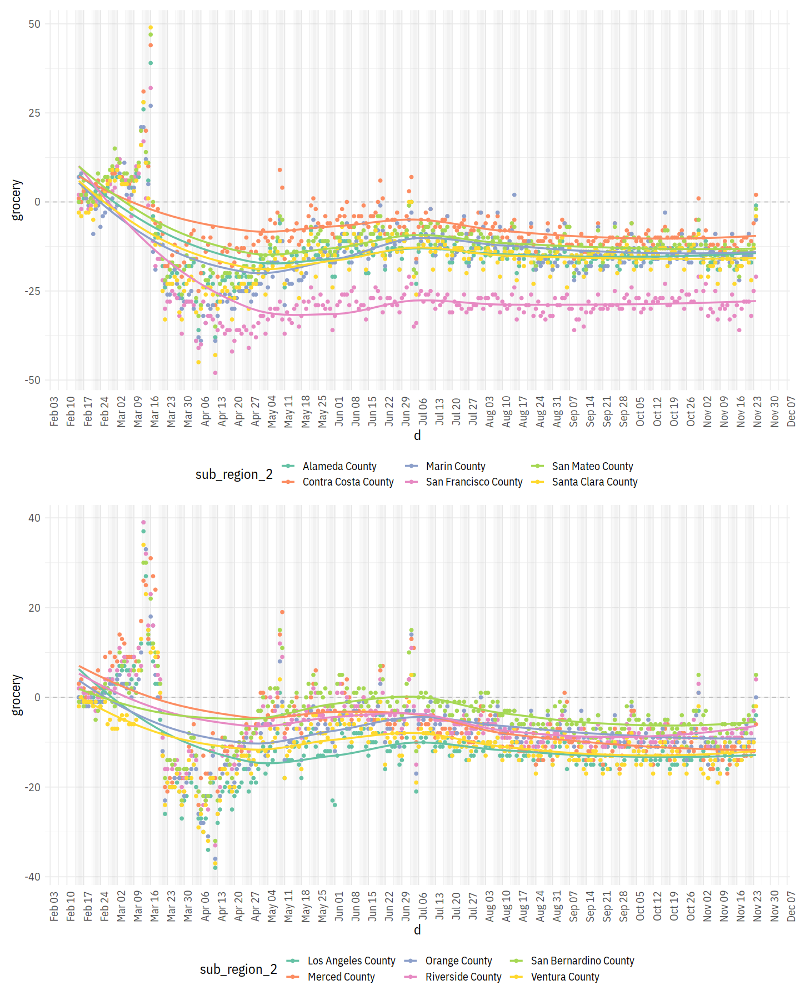

In [14]:
options(repr.plot.width = 12, repr.plot.height=15)
mobility_plotter(bay_area, grocery, leg = T) / mobility_plotter(la_area, grocery, leg = T)

`geom_smooth()` using method = 'loess' and formula 'y ~ x'

Warning message:
“Removed 28 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 28 rows containing missing values (geom_point).”
`geom_smooth()` using method = 'loess' and formula 'y ~ x'

Warning message:
“Removed 25 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 25 rows containing missing values (geom_point).”


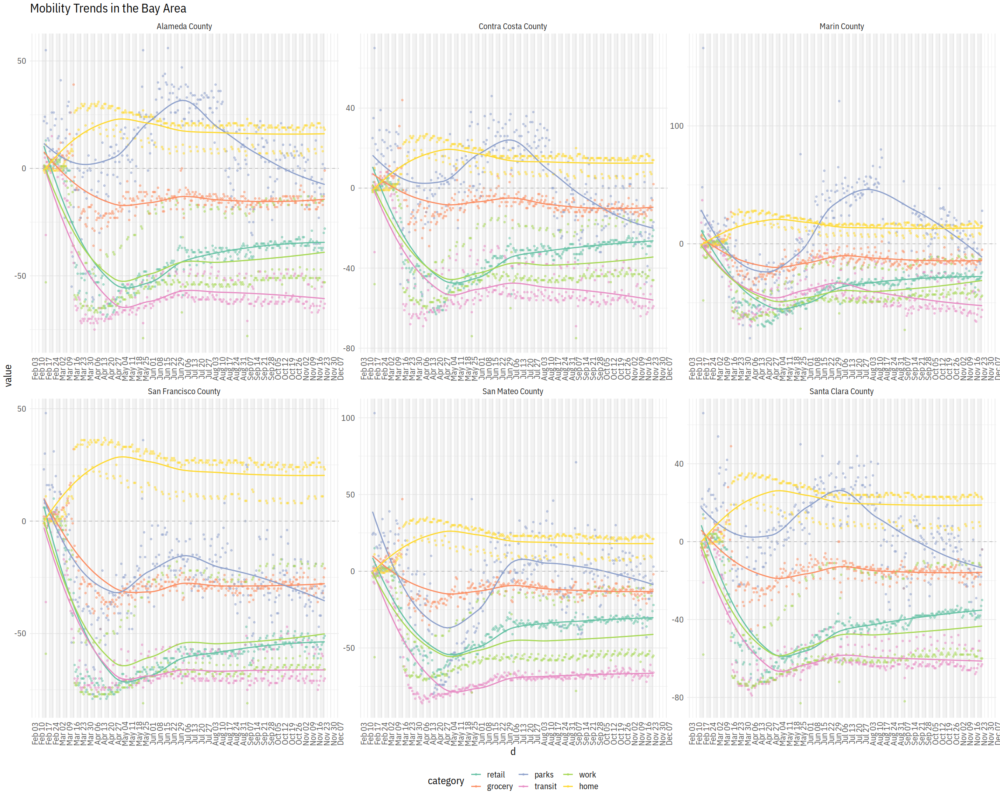

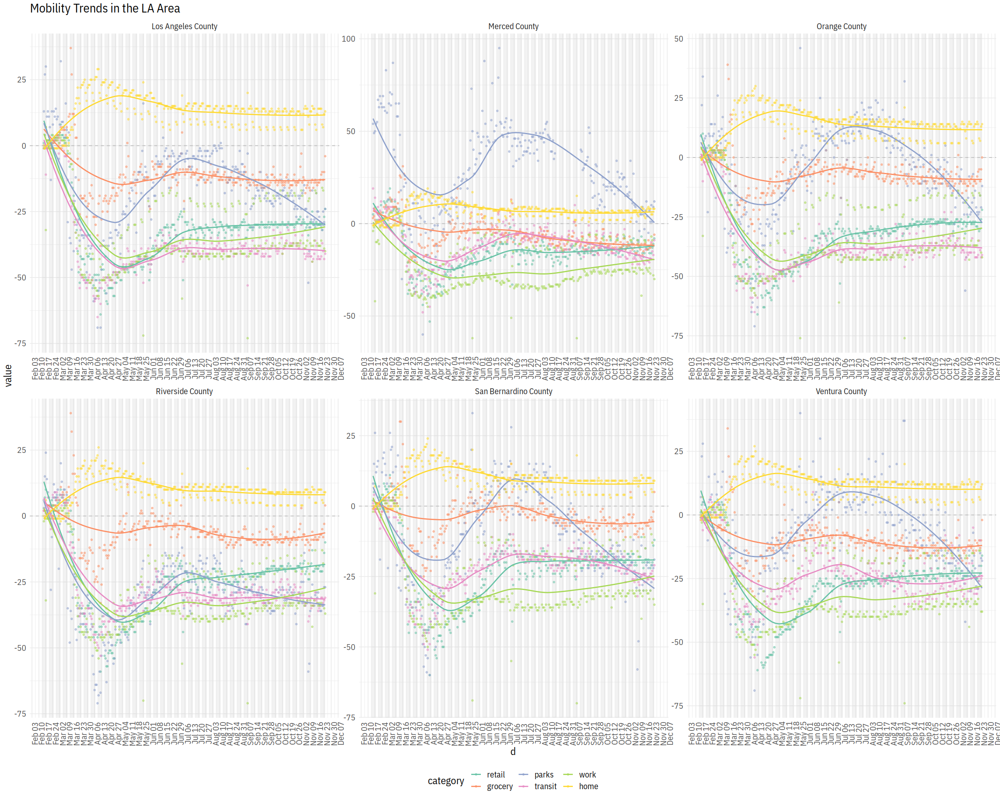

In [15]:
options(repr.plot.width = 20, repr.plot.height=16)
mobility_faceted(bay_area2) + ggtitle("Mobility Trends in the Bay Area")
mobility_faceted(la_area2)  + ggtitle("Mobility Trends in the LA Area")

## International

### Helper Functions

In [16]:
melter = function(df, keys = c("country_region", "d", "weekend")){
    df_long = melt(df, id.vars = keys,
        measure = c("retail", "grocery", "parks", "transit", "work", "home"),
        variable.name = "category")
    return(df_long)
}

subregion_faceted = function(df, cmap = T, freescale = F, leg = T, wknd = T){
    p = ggplot(df, aes(x = d, y = value, group = category, colour = category))
    if (wknd == T){
        p = p + geom_vline(data = df[weekend == T], mapping = aes(xintercept = d),
                     color = 'gray', size = 2.9, alpha = 0.1)
    }
    p = p +
        geom_point(size = 1, alpha = 0.5) + geom_smooth(se = F, size = 0.6) +
        geom_hline(yintercept = 0, colour = 'gray', linetype = 'dashed') +
        scale_x_date(date_breaks = "1 week", date_labels = "%m-%d")
    if (freescale == T) {
        p = p + facet_wrap(~ sub_region_1, scale = "free_y")
    } else{
        p = p + facet_wrap(~ sub_region_1)
    }
    if (cmap == T) p = p + scale_colour_brewer(palette = "Set2")
    if (leg == F) p = p + guides(colour = F)
    return(p)
}

country_faceted = function(df, freescale = F,  cmap = F, leg = F, wknd = T){
    p = ggplot(df, aes(x = d, y = value))
    if (wknd == T){
        p = p + geom_vline(data = df[weekend == T], mapping = aes(xintercept = d),
                     color = 'gray', size = 2.9, alpha = 0.1)
    }
    p = p +
        geom_point(size = 1, alpha = 0.5) + geom_smooth(se = F, size = 0.6) +
        geom_hline(yintercept = 0, colour = 'gray', linetype = 'dashed') +
        scale_x_date(date_breaks = "1 week", date_labels = "%m-%d")
    if (freescale == T) {
        p = p + facet_wrap(~ category, scale = "free")
    } else{
        p = p + facet_wrap(~ category)
    }
    if (cmap == T) p = p + scale_colour_brewer(palette = "Set2")
    if (leg == F) p = p + guides(colour = F)
    return(p)
}

mob_plotter = function(df, col, grp, leg = T){
    p = df %>%
        ggplot(aes(x = d, y = {{ col }}, group = {{grp}}, colour = {{grp}})) +
            geom_hline(yintercept = 0, colour = 'gray', linetype = 'dashed') +
            geom_vline(data = df[weekend == T],
                     mapping = aes(xintercept = d),
                     color = 'gray', size = 2.9, alpha = 0.3) +
        geom_point() + geom_smooth(se = F) +
        scale_x_date(date_breaks = "1 week", date_labels = "%m-%d")
    if (leg == F) p = p + guides(colour = F)
    return(p)
}

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



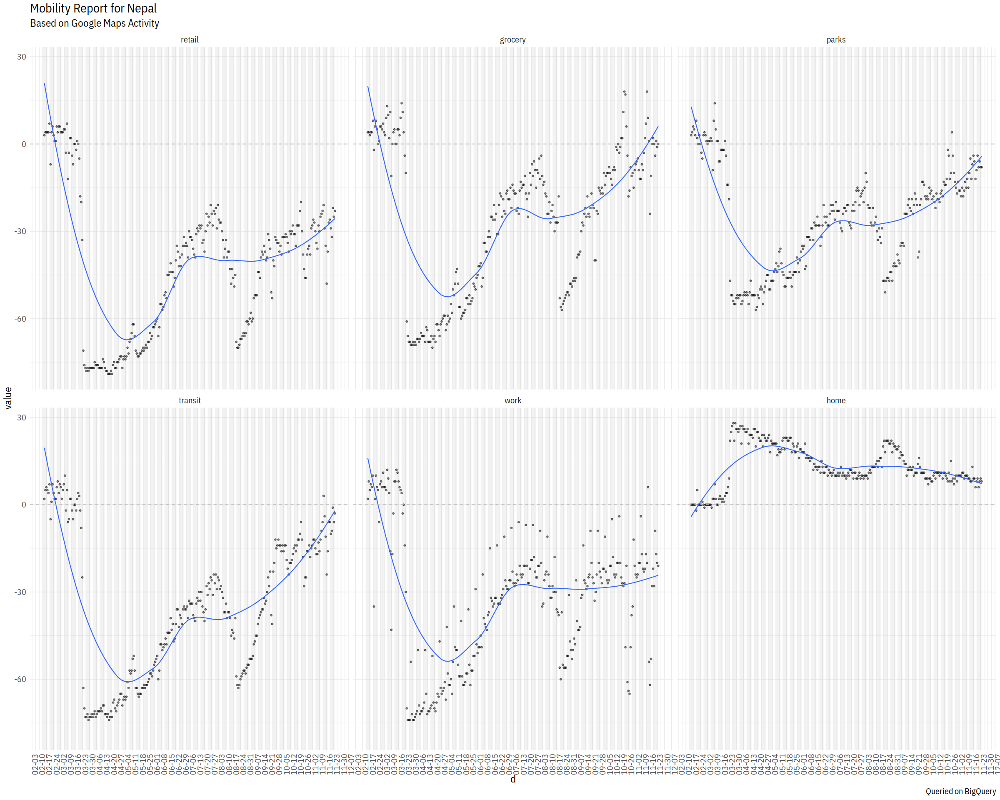

In [17]:
nep = mobility_df[country_region =="Nepal"]
nep_l = melter(nep)
(nep = country_faceted(nep_l) +
    labs(title = "Mobility Report for Nepal", subtitle = "Based on Google Maps Activity", caption = "Queried on BigQuery"))

In [18]:
ggsave("nep_mobility.jpg", nep, width = 20, height = 15)

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,date,retail,grocery,parks,transit,work,home,d,weekend
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<date>,<int>,<int>,<int>,<int>,<int>,<int>,<date>,<lgl>
IN,India,Bihar,,,IN-BR,NA,2020-02-15,4,5,3,6,6,-1,2020-02-15,TRUE
IN,India,Bihar,,,IN-BR,NA,2020-02-16,6,4,4,10,2,-1,2020-02-16,TRUE
IN,India,Bihar,,,IN-BR,NA,2020-02-17,3,3,4,6,2,-1,2020-02-17,FALSE
IN,India,Bihar,,,IN-BR,NA,2020-02-18,3,4,7,8,2,-1,2020-02-18,FALSE
IN,India,Bihar,,,IN-BR,NA,2020-02-19,3,7,6,7,5,-1,2020-02-19,FALSE
IN,India,Bihar,,,IN-BR,NA,2020-02-20,3,6,6,10,2,-2,2020-02-20,FALSE


`geom_smooth()` using method = 'loess' and formula 'y ~ x'



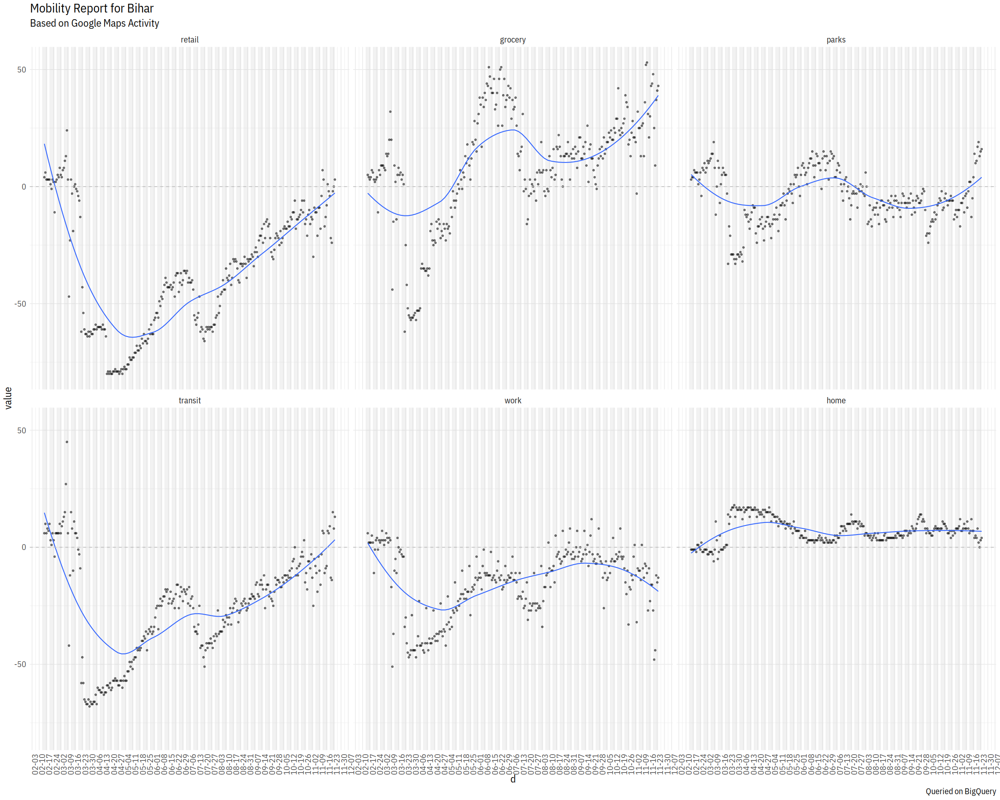

In [19]:
bih = mobility_df[country_region =="India" & sub_region_1 == "Bihar" & sub_region_2 == ""]
bih %>% head
bih_l = melter(bih)
(bih = country_faceted(bih_l) +
    labs(title = "Mobility Report for Bihar", subtitle = "Based on Google Maps Activity", caption = "Queried on BigQuery"))

`geom_smooth()` using method = 'loess' and formula 'y ~ x'

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



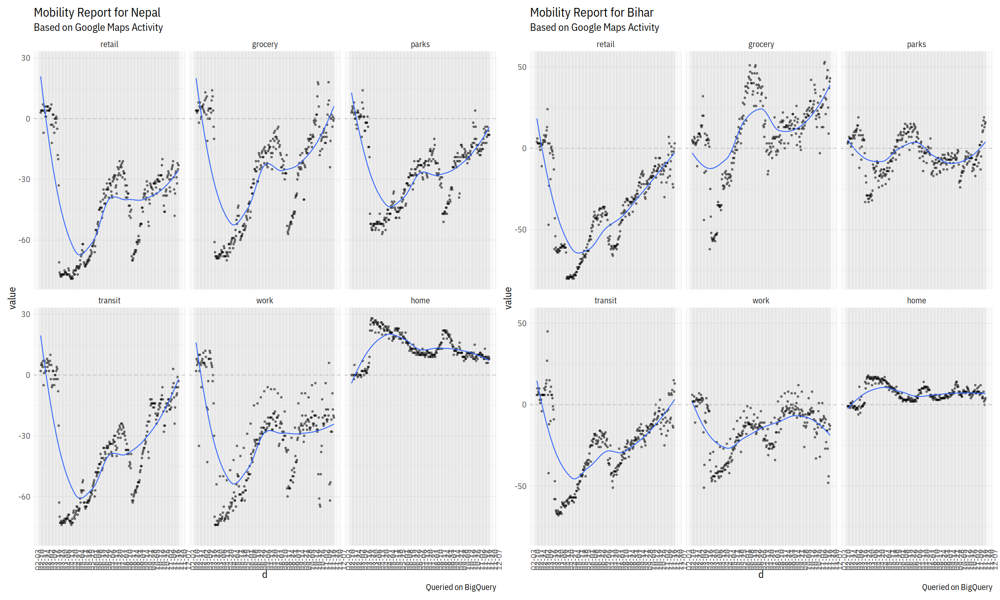

In [20]:
options(repr.plot.width = 20, repr.plot.height=12)
(nep | bih)

country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,date,retail,grocery,parks,transit,work,home,d,weekend
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<date>,<int>,<int>,<int>,<int>,<int>,<int>,<date>,<lgl>
IN,India,Andaman and Nicobar Islands,,,IN-AN,NA,2020-02-15,1,-9,5,-2,6,2,2020-02-15,TRUE
IN,India,Andaman and Nicobar Islands,,,IN-AN,NA,2020-02-16,0,-6,1,2,4,NA,2020-02-16,TRUE
IN,India,Andaman and Nicobar Islands,,,IN-AN,NA,2020-02-17,-1,2,5,1,6,1,2020-02-17,FALSE
IN,India,Andaman and Nicobar Islands,,,IN-AN,NA,2020-02-18,-2,12,-4,-1,4,3,2020-02-18,FALSE
IN,India,Andaman and Nicobar Islands,,,IN-AN,NA,2020-02-19,-5,9,-6,2,4,1,2020-02-19,FALSE
IN,India,Andaman and Nicobar Islands,,,IN-AN,NA,2020-02-20,-2,-4,3,-1,1,1,2020-02-20,FALSE


`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

Warning message:
“Removed 76999 rows containing non-finite values (stat_smooth).”
Warning message:
“Computation failed in `stat_smooth()`:
x has insufficient unique values to support 10 knots: reduce k.”
Warning message:
“Removed 76999 rows containing missing values (geom_point).”
`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

Warning message:
“Removed 76999 rows containing non-finite values (stat_smooth).”
Warning message:
“Computation failed in `stat_smooth()`:
x has insufficient unique values to support 10 knots: reduce k.”
Warning message:
“Removed 76999 rows containing missing values (geom_point).”


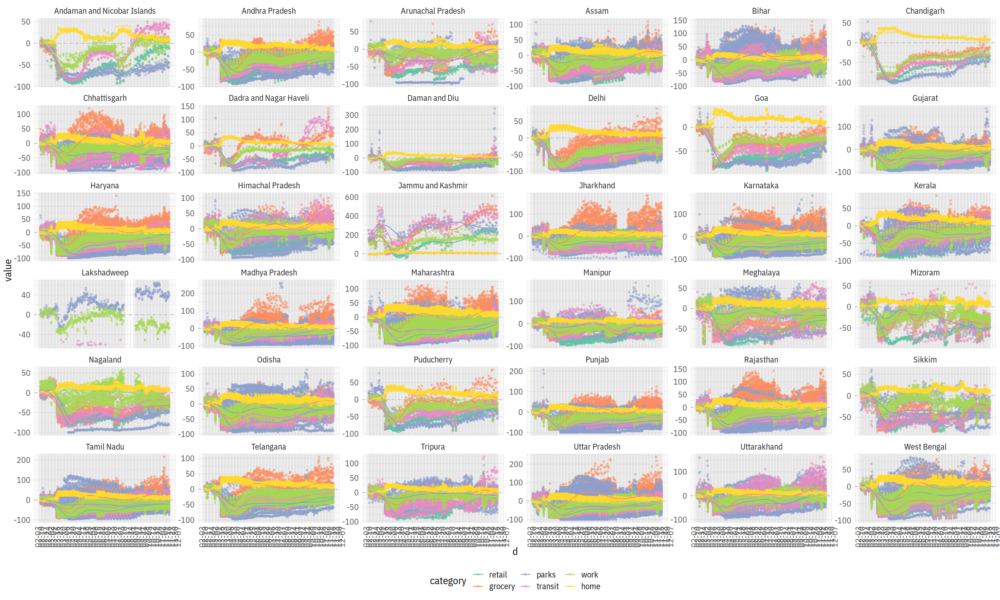

In [21]:
ind = mobility_df[country_region =="India"]
ind_l = melter(ind, c("sub_region_1", "d", "weekend"))
ind_l = ind_l[sub_region_1 != ""]
ind %>% head

(ind_disagg = subregion_faceted(ind_l, freescale = T))
ggsave("ind_mobility.jpg", ind_disagg, width = 30, height = 30)

Jammu and Kashmir up by 300%+ because the baseline period corresponds with a sever lockdown [for political reasons - abrogation of article 370 etc]. Baselines matter in DiD.

`geom_smooth()` using method = 'loess' and formula 'y ~ x'

Warning message:
“Removed 306 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 306 rows containing missing values (geom_point).”


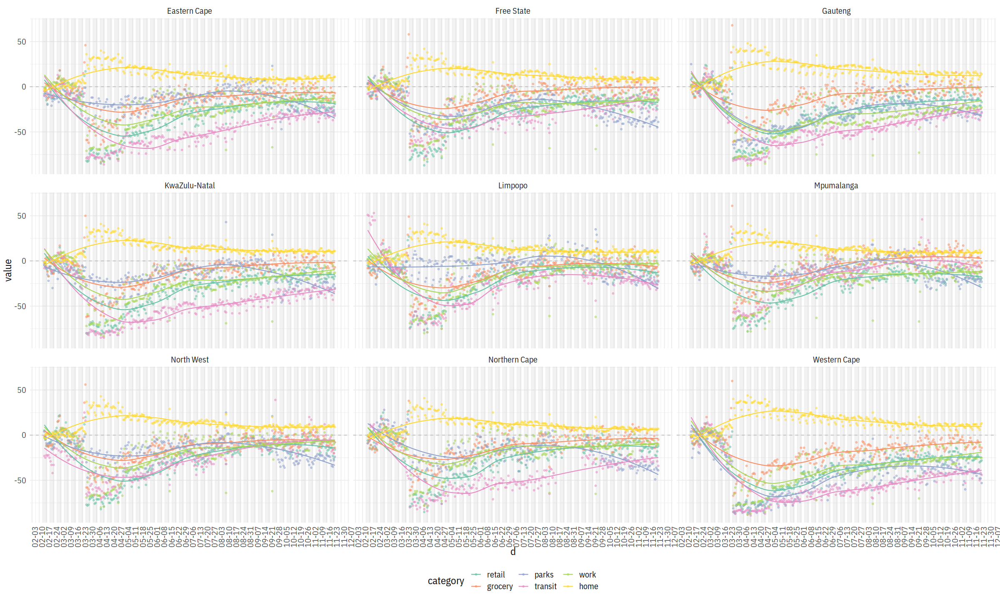

In [22]:
d = mobility_df[country_region =="South Africa"]
d_l= melter(d, c("sub_region_1", "d", "weekend")) %>% .[sub_region_1 != ""]
(ind_disagg = subregion_faceted(d_l))

### Subregion Data Availability

In [23]:
countries_w_subn = mobility_df[, .(sub = unique(sub_region_1)), by = country_region][sub != ""]
countries_w_subn[, unique(country_region)] %>% print

 [1] "United Arab Emirates" "Antigua and Barbuda"  "Angola"              
 [4] "Argentina"            "Austria"              "Australia"           
 [7] "Barbados"             "Belgium"              "Burkina Faso"        
[10] "Bulgaria"             "Benin"                "Bolivia"             
[13] "Brazil"               "The Bahamas"          "Belize"              
[16] "Canada"               "Switzerland"          "Côte d'Ivoire"       
[19] "Chile"                "Cameroon"             "Colombia"            
[22] "Cape Verde"           "Czechia"              "Germany"             
[25] "Denmark"              "Dominican Republic"   "Ecuador"             
[28] "Estonia"              "Egypt"                "Spain"               
[31] "Finland"              "France"               "Gabon"               
[34] "United Kingdom"       "Guatemala"            "Honduras"            
[37] "Croatia"              "Haiti"                "Hungary"             
[40] "Indonesia"            "Ireland" 

In [24]:
countries_w_subn = mobility_df[, .(sub = unique(sub_region_2)), by = country_region][sub != ""]
countries_w_subn[, unique(country_region)] %>% print

 [1] "Argentina"      "Austria"        "Australia"      "Belgium"       
 [5] "Bulgaria"       "Bolivia"        "Brazil"         "Canada"        
 [9] "Chile"          "Cameroon"       "Colombia"       "Czechia"       
[13] "Denmark"        "Ecuador"        "Spain"          "Finland"       
[17] "France"         "United Kingdom" "Guatemala"      "Honduras"      
[21] "Israel"         "India"          "Italy"          "Lebanon"       
[25] "Lithuania"      "Mozambique"     "Nigeria"        "Netherlands"   
[29] "Norway"         "Peru"           "Poland"         "Portugal"      
[33] "Romania"        "Rwanda"         "Sweden"         "Slovenia"      
[37] "Slovakia"       "Turkey"         "Tanzania"       "Uganda"        
[41] "United States"  "Zimbabwe"      


# Oxford Govt Policy Tracker

In [25]:
options(repr.plot.width = 12, repr.plot.height=10)

In [26]:
projid <- Sys.getenv("GCE_DEFAULT_PROJECT_ID")
bq_auth(email = "lal.apoorva@gmail.com",
       path = "~/keys/sandbox.json")

In [27]:
bq_con <-  dbConnect(
    bigrquery::bigquery(),
    project = "bigquery-public-data",
    dataset = "covid19_govt_response",
    billing = projid
    )
bq_con
dbListTables(bq_con)

<BigQueryConnection>
  Dataset: bigquery-public-data.covid19_govt_response
  Billing: spatial-acumen-244921

[1] "oxford_policy_tracker"

In [28]:
mob <- tbl(bq_con, "oxford_policy_tracker")
mob %>% glimpse

Rows: ??
Columns: 53
Database: BigQueryConnection
$ country_name                            <chr> "Aruba", "Aruba", "Aruba", "A…
$ alpha_3_code                            <chr> "ABW", "ABW", "ABW", "ABW", "…
$ region_name                             <chr> NA, NA, NA, NA, NA, NA, NA, N…
$ region_code                             <chr> NA, NA, NA, NA, NA, NA, NA, N…
$ date                                    <date> 2020-11-19, 2020-11-20, 2020…
$ school_closing                          <chr> NA, NA, NA, NA, NA, NA, "2.00…
$ school_closing_flag                     <chr> NA, NA, NA, NA, NA, NA, "1", …
$ school_closing_notes                    <chr> NA, NA, NA, NA, NA, NA, NA, "…
$ workplace_closing                       <chr> NA, NA, NA, NA, NA, NA, "2.00…
$ workplace_closing_flag                  <chr> NA, NA, NA, NA, NA, NA, "1", …
$ workplace_closing_notes                 <chr> NA, NA, NA, NA, NA, NA, NA, "…
$ cancel_public_events                    <chr> NA, NA, NA, NA, NA, NA, "1.00…
$ 

In [29]:
tic()
mob %>% collect() ->
    policies
toc()

11.432 sec elapsed


In [30]:
policies %<>% setDT

fwrite(policies, "data/ox_policy_tracker.csv")
dbDisconnect(bq_con)

### Viz

In [31]:
policies = fread("data/ox_policy_tracker.csv")
policies[, date := lubridate::ymd(date)]
policies %>% glimpse

Rows: 77,826
Columns: 53
$ country_name                            <chr> "Aruba", "Aruba", "Aruba", "A…
$ alpha_3_code                            <chr> "ABW", "ABW", "ABW", "ABW", "…
$ region_name                             <chr> "", "", "", "", "", "", "", "…
$ region_code                             <chr> "", "", "", "", "", "", "", "…
$ date                                    <date> 2020-11-19, 2020-11-20, 2020…
$ school_closing                          <dbl> NA, NA, NA, NA, NA, NA, 2, 2,…
$ school_closing_flag                     <int> NA, NA, NA, NA, NA, NA, 1, 1,…
$ school_closing_notes                    <chr> "", "", "", "", "", "", "", "…
$ workplace_closing                       <dbl> NA, NA, NA, NA, NA, NA, 2, 2,…
$ workplace_closing_flag                  <int> NA, NA, NA, NA, NA, NA, 1, 1,…
$ workplace_closing_notes                 <chr> "", "", "", "", "", "", "", "…
$ cancel_public_events                    <dbl> NA, NA, NA, NA, NA, NA, 1, 1,…
$ cancel_public_events_flag

In [32]:
policies[, .N, by = .(country_name, alpha_3_code)][order(country_name)]

country_name,alpha_3_code,N
<chr>,<chr>,<int>
Afghanistan,AFG,327
Albania,ALB,327
Algeria,DZA,327
Andorra,AND,327
Angola,AGO,327
Argentina,ARG,327
Aruba,ABW,327
Australia,AUS,327
Austria,AUT,327


In [33]:
sa = policies[alpha_3_code %in% c("IND", "NPL", "PAK", "BGD", "LKA", "AFG")]

tsplot = function(df){
    p = ggplot(df, aes(x = date, y = stringency_index, group = alpha_3_code, colour = alpha_3_code)) +
    geom_point() + geom_line() + scale_colour_brewer(palette = "Set2")
    return(p)
}

Warning message:
“Removed 6 rows containing missing values (geom_point).”


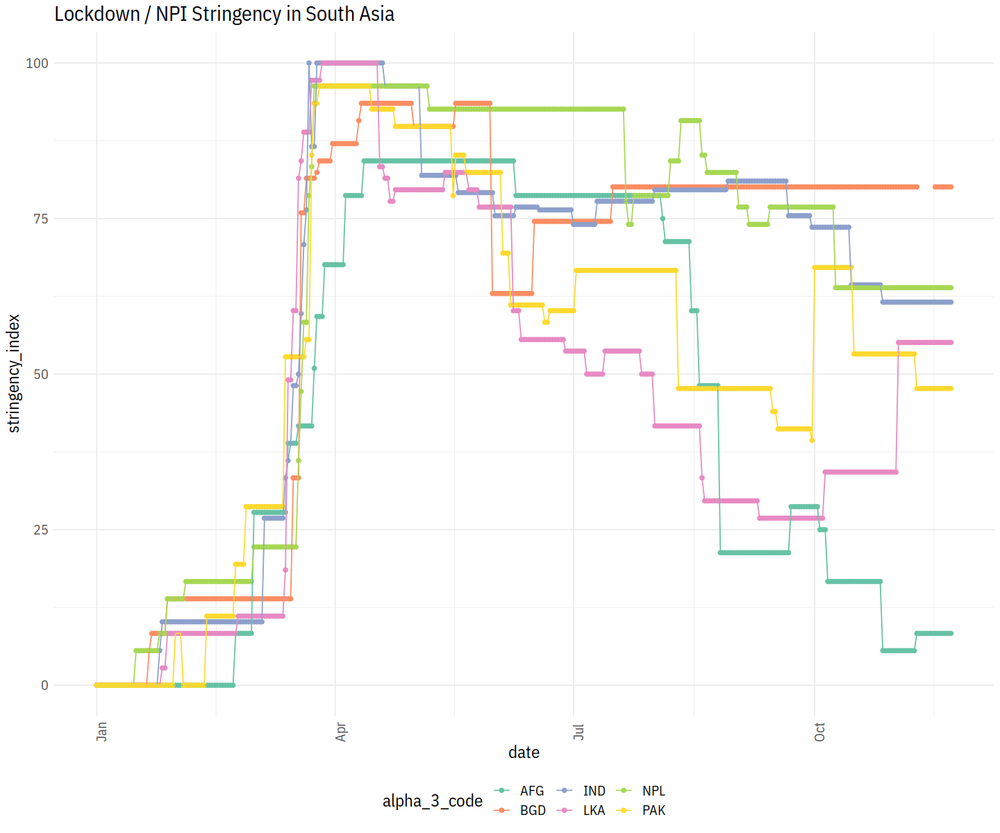

In [34]:
tsplot(sa) + ggtitle("Lockdown / NPI Stringency in South Asia")